# Assigment 3

Für die bevorstehende Aufgabe steht die Zählung der roten Smarties auf den Bildern im Fokus. Hierfür wird ein Convolutional Neural Network (CNN) für die Objekterkennung eingesetzt. Die Anwendung von Farbfiltern zur Smarties-Erkennung erwies sich aufgrund unterschiedlicher Belichtungen als problematisch. Um dieses Hindernis zu überwinden, habe ich mich entschieden, PyTorch und Ultralytics zu installieren und zu importieren.

Für das Training des YOLO-Netzwerks wird ein passendes Dataset, welches aus 400 Bilder von annotierten Skittels bestand, verwendet, das zuvor aus dem Internet heruntergeladen wurde. Das Dataset kann unter folgender Quelle gefunden werden: https://universe.roboflow.com/ds/1KJcTKgf22?key=iQhRha9TPd

In [19]:
!pip install --user torchvision torchaudio
!pip install --user ultralytics
!pip install --user opencv-python

from ultralytics import YOLO
import os
from IPython.display import Image, display
import cv2
import numpy as np

model_path = r'C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smartie_yolov8.pt'
image_path = r'C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties0.png'
input_folder_path = r'C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img'

In den nachfolgenden Abschnitten wird ein Yolo-Netzt verwendet, um die verschiedenen Farben der Smarties auf Bildern zu erkennen und zu zählen. Nach der Modellinitialisierung und dem Einlesen des Bildes mit OpenCV werden Farben mithilfe von HSV-Werten erkannt, wobei vordefinierte Schwellenwerte genutzt werden. Die Ergebnisse des Modells werden verwendet, um die Anzahl verschiedener Farben auf dem Bild zu zählen, und die Informationen werden in den Dictionaries gespeichert. Außerdem werden Boxen um die erkannten Objekte gezeichnet, und das bearbeitete Bild wird angezeigt sowie als Datei (all_detect.png) gespeichert.


image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties0.png: 384x640 90 smarties, 253.6ms
Speed: 3.1ms preprocess, 253.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


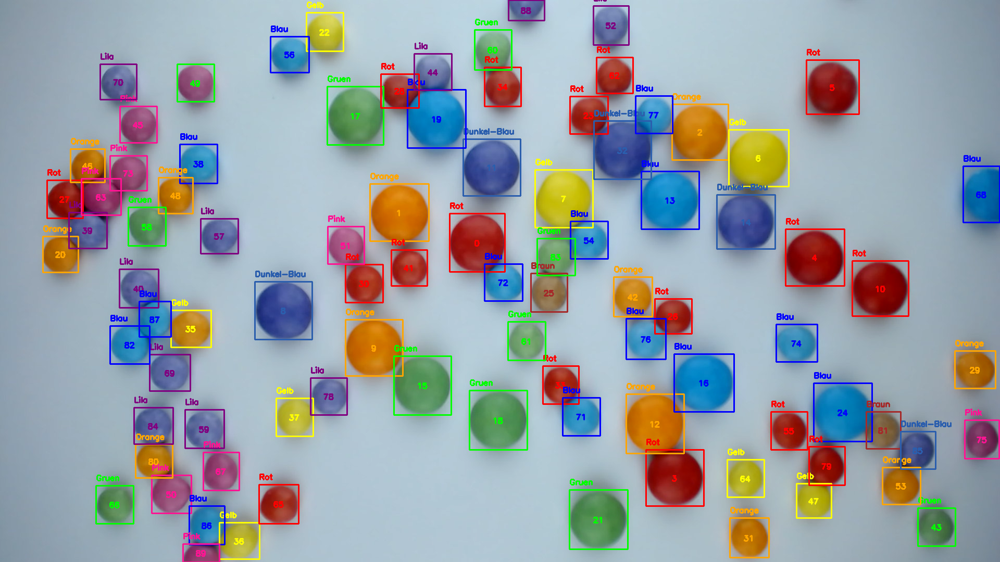

Rot: 17 Mal
Blau: 16 Mal
Dunkel-Blau: 5 Mal
Gelb: 8 Mal
Gruen: 10 Mal
Lila: 11 Mal
Pink: 8 Mal
Braun: 2 Mal
Orange: 12 Mal


In [21]:

model = YOLO(model_path)
results = model(image_path)
image = cv2.imread(image_path)

def detect_color_hsv(image, x, y, color_thresholds):
    box_size = 1
    x1, y1, x2, y2 = x - box_size, y - box_size, x + box_size, y + box_size
    crop = image[y1:y2, x1:x2]

    # Konvertiere in das HSV-Farbmodell
    hsv_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)

    # Berechne Farbwert im Ausschnitt
    avg_hsv = np.mean(hsv_crop, axis=(0, 1))

    # Definiere Schwellenwerte für Farben
    color_thresholds = {
        'Rot': ([0, 100, 100], [5, 255, 255]),
        'Blau': ([55, 150, 165], [108, 255, 255]),
        'Dunkel-Blau': ([108, 130, 105], [140, 213, 180]),
        'Gelb': ([20, 100, 100], [30, 255, 255]),
        'Gruen': ([40, 40, 70], [95, 255, 255]),
        'Lila': ([111, 59, 116], [144, 121, 255]),
        'Pink': ([155, 104, 96], [164, 195, 180]),
        'Braun': ([16, 38, 36], [30, 186, 151]),
        'Orange': ([9, 180, 100], [23, 255, 255])
    }

    # Vergleiche durchschnittlichen HSV-Wert mit Schwellenwerten
    detected_color = None

    for color_name, (lower, upper) in color_thresholds.items():
        if np.all(np.logical_and(avg_hsv >= lower, avg_hsv <= upper)):
            detected_color = color_name
            break

    return detected_color

def count_colors(image, results, color_thresholds):
    color_counts = {color: 0 for color in color_thresholds.keys()}
    box_colors = {}

    for result in results:
        boxes = result.boxes.cpu().numpy().xyxy
        for idx, box in enumerate(boxes):
            x, y = int((box[0] + box[2]) / 2), int((box[1] + box[3]) / 2)
            color = detect_color_hsv(image, x, y, color_thresholds)
            if color:
                color_counts[color] += 1
                box_colors[idx] = color

    return color_counts, box_colors

color_thresholds = {
        'Rot': ([0, 100, 100], [5, 255, 255]),
        'Blau': ([55, 150, 165], [108, 255, 255]),
        'Dunkel-Blau': ([108, 130, 105], [140, 213, 180]),
        'Gelb': ([20, 100, 100], [30, 255, 255]),
        'Gruen': ([40, 40, 70], [95, 255, 255]),
        'Lila': ([111, 59, 116], [144, 121, 255]),
        'Pink': ([155, 104, 96], [164, 195, 180]),
        'Braun': ([16, 38, 36], [30, 186, 151]),
        'Orange': ([9, 180, 100], [23, 255, 255])
    }

color_counts, box_colors = count_colors(image, results, color_thresholds)

# Definiere Farbwerte für die erkannte Farbe
color_values = {
    'Rot': (0, 0, 255), 
    'Blau': (255, 0, 0),  
    'Dunkel-Blau': (173, 94, 43),  
    'Gelb': (0, 255, 255),  
    'Gruen': (0, 255, 0),  
    'Lila': (128, 0, 128),  
    'Pink': (147, 20, 255), 
    'Braun': (42, 42, 165),  
    'Orange': (0, 165, 255)  
}

# Bounding Boxen mit Farben, Nummern und Farbtext
for result in results:
    boxes = result.boxes.cpu().numpy().xyxy
    for idx, box in enumerate(boxes):
        x1, y1, x2, y2 = map(int, box)
        color = color_values.get(box_colors.get(idx), (0, 255, 0))
        thickness = 2 
        cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)
        text = f'{idx}'
        (text_width, text_height), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
        text_x = x1 + (x2 - x1 - text_width) // 2
        text_y = y1 + (y2 - y1 + text_height) // 2
        cv2.putText(image, text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        cv2.putText(image, box_colors.get(idx), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Anzeigen des Bildes mit Bounding Boxen, Nummern und Farben
cv2.imshow('Bild mit Bounding Boxen, Nummern und Farben', image)
output_image_path = 'all_detect.png'
cv2.imwrite(output_image_path, image)
display(Image(filename=output_image_path))

# Ausgabe
for color, count in color_counts.items():
    print(f'{color}: {count} Mal')



Für die nachfolgenden Bilder wird nach dem Schema die unterschiedlichen Farben zwar erkannt, aber ausschleißlich die roten Smarties gezählt.


image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties0.png: 384x640 90 smarties, 255.8ms
Speed: 1.5ms preprocess, 255.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


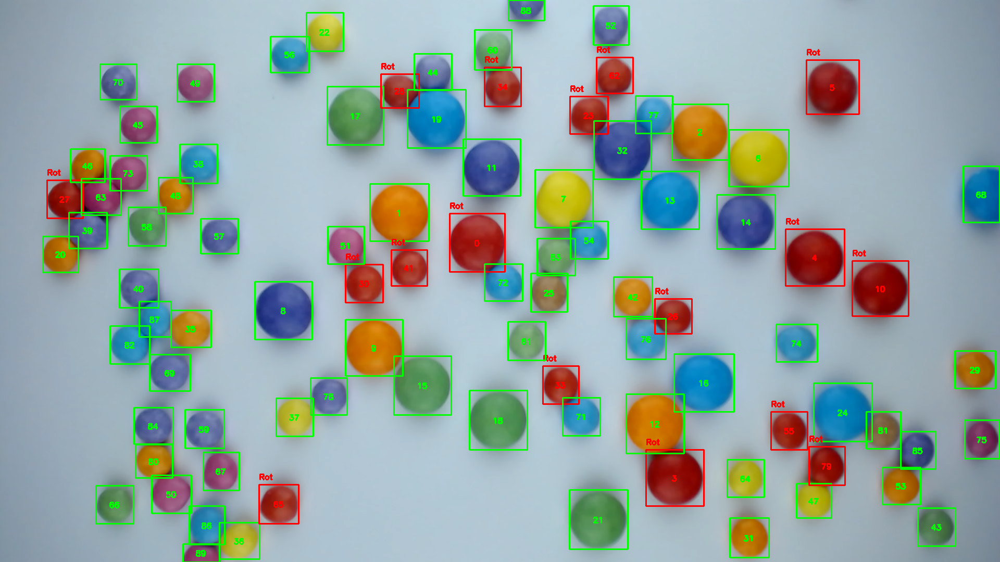

smarties0.png:
   Rot: 17 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties1.png: 384x640 87 smarties, 303.5ms
Speed: 2.5ms preprocess, 303.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


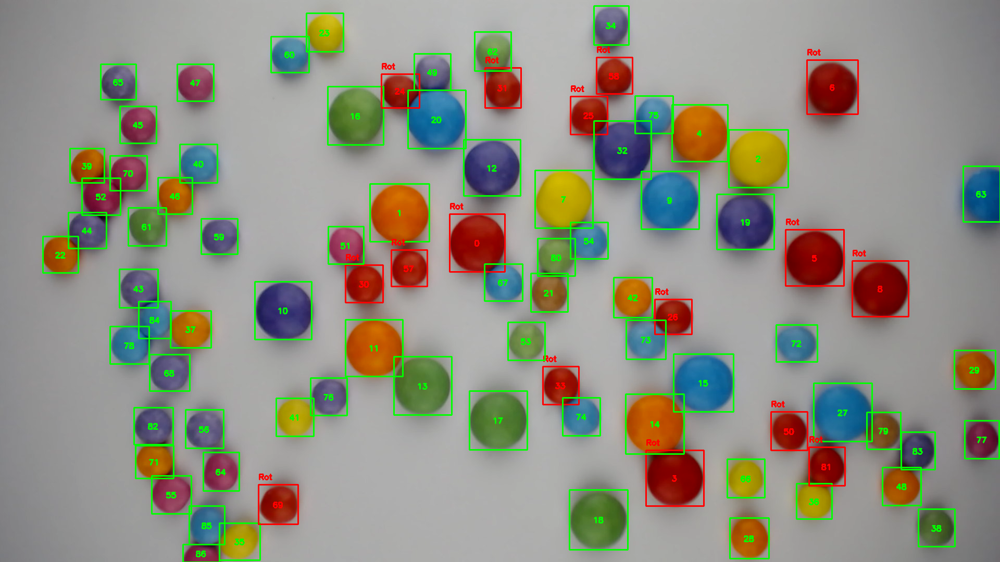

smarties1.png:
   Rot: 16 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties2.png: 384x640 81 smarties, 298.3ms
Speed: 2.0ms preprocess, 298.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


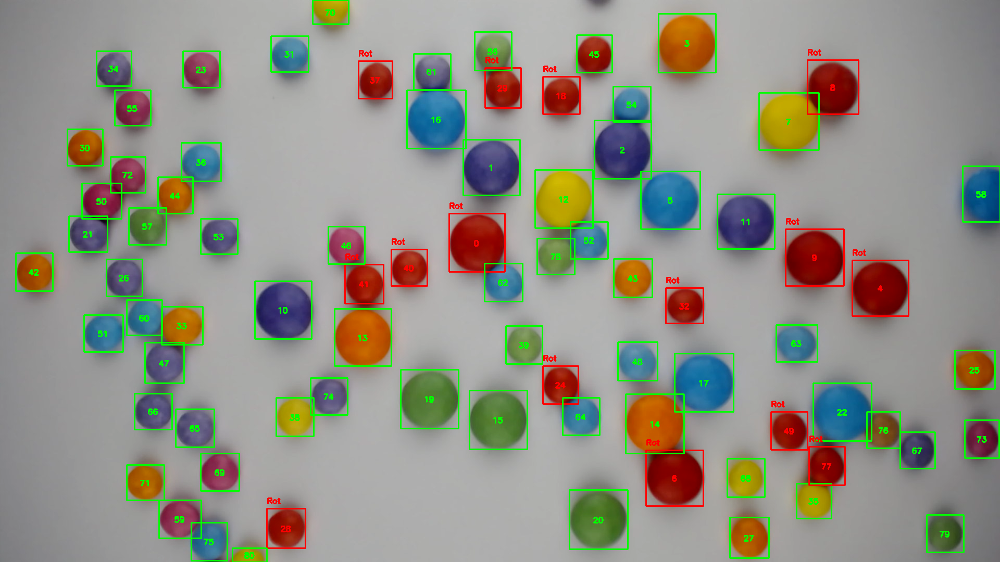

smarties2.png:
   Rot: 15 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties3.png: 384x640 77 smarties, 254.9ms
Speed: 2.0ms preprocess, 254.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


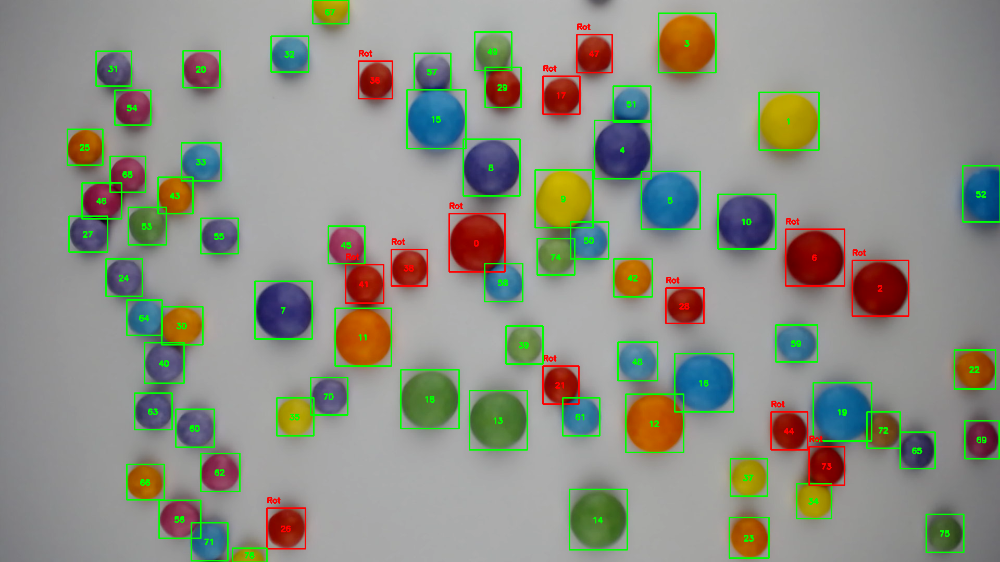

smarties3.png:
   Rot: 13 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties4.png: 384x640 68 smarties, 256.0ms
Speed: 3.0ms preprocess, 256.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


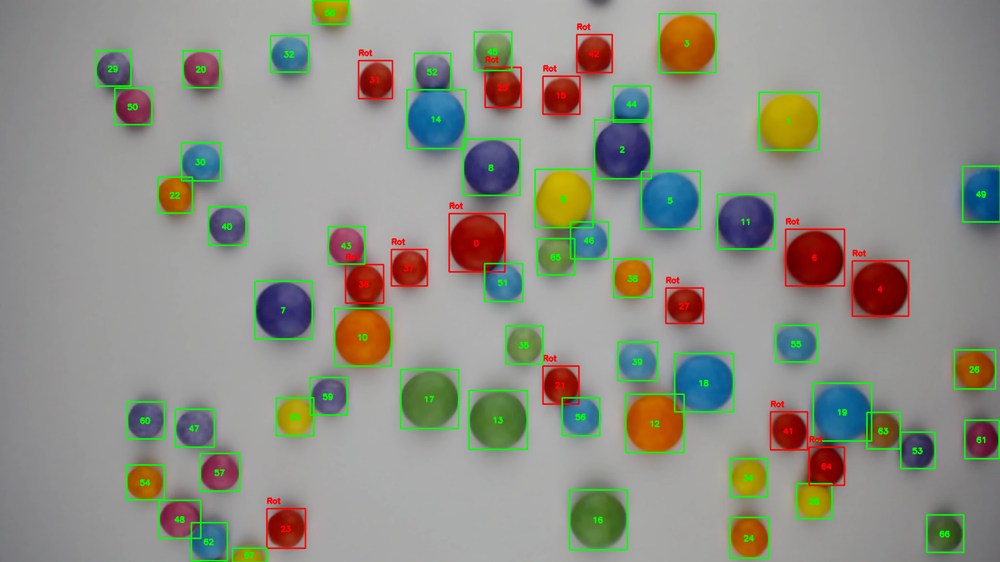

smarties4.png:
   Rot: 14 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties5.png: 384x640 64 smarties, 277.1ms
Speed: 2.5ms preprocess, 277.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


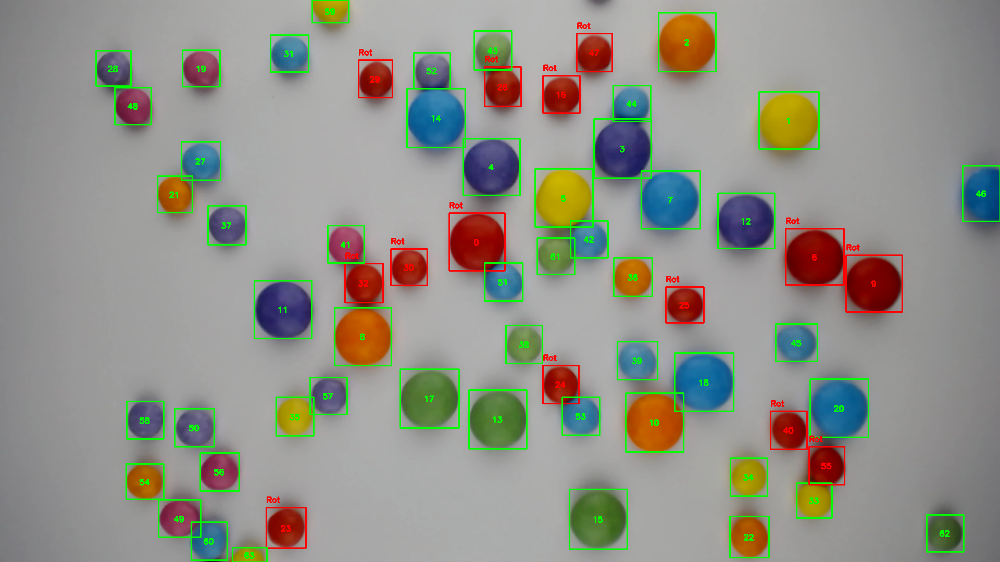

smarties5.png:
   Rot: 14 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties6.png: 384x640 59 smarties, 259.8ms
Speed: 1.5ms preprocess, 259.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


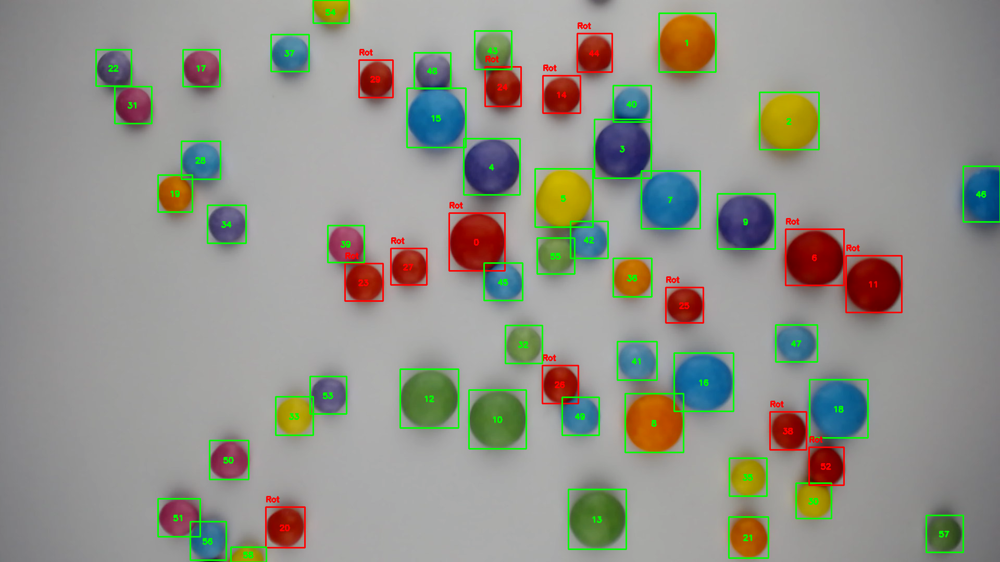

smarties6.png:
   Rot: 14 Mal

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties7.png: 384x640 52 smarties, 260.2ms
Speed: 2.0ms preprocess, 260.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


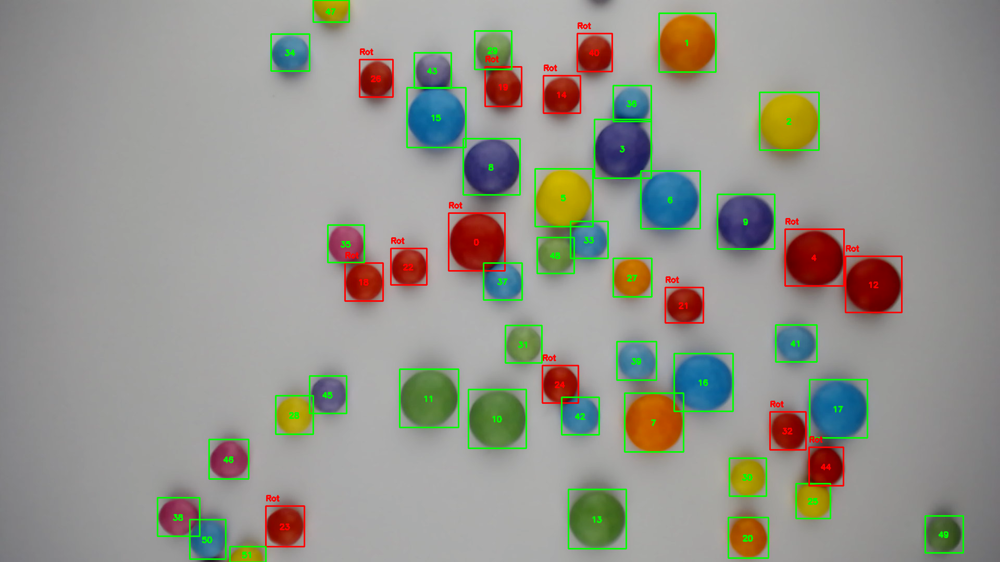

smarties7.png:
   Rot: 14 Mal


In [22]:
# Definiere Farbschwellenwerte
color_thresholds = {'Rot': ([0, 100, 100], [5, 255, 255])}

# Definiere Farbwerte für erkannte Farbe
color_values = {'Rot': (0, 0, 255)}  

def detect_color_hsv(image, x, y, color_thresholds):
    box_size = 1
    x1, y1, x2, y2 = x - box_size, y - box_size, x + box_size, y + box_size
    crop = image[y1:y2, x1:x2]

    # Konvertieren in HSV-Farbmodell
    hsv_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)

    # Berechnen Farbwert
    avg_hsv = np.mean(hsv_crop, axis=(0, 1))

    # Definiere Schwellenwerte 
    color_thresholds = {
        'Rot': ([0, 100, 100], [5, 255, 255]),
    }

    # Vergleiche HSV-Wert mit Schwellenwerten
    detected_color = None

    for color_name, (lower, upper) in color_thresholds.items():
        if np.all(np.logical_and(avg_hsv >= lower, avg_hsv <= upper)):
            detected_color = color_name
            break

    return detected_color

def count_colors(image, results, color_thresholds):
    color_counts = {color: 0 for color in color_thresholds.keys()}
    box_colors = {}

    for result in results:
        boxes = result.boxes.cpu().numpy().xyxy
        for idx, box in enumerate(boxes):
            x, y = int((box[0] + box[2]) / 2), int((box[1] + box[3]) / 2)
            color = detect_color_hsv(image, x, y, color_thresholds)
            if color:
                color_counts[color] += 1
                box_colors[idx] = color

    return color_counts, box_colors

# Iterieren über die Dateien im Ordner
for filename in os.listdir(input_folder_path):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        
        image_path = os.path.join(input_folder_path, filename)

        model = YOLO(model_path)
        results = model(image_path)
        image = cv2.imread(image_path)

        # Zähle Farben
        color_counts, box_colors = count_colors(image, results, color_thresholds)

        # Zeichne Bounding Boxen mit Farben und Nummern
        for result in results:
            boxes = result.boxes.cpu().numpy().xyxy
            for idx, box in enumerate(boxes):
                x1, y1, x2, y2 = map(int, box)
                color = color_values.get(box_colors.get(idx), (0, 255, 0))
                thickness = 2
                cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)
                text = f'{idx}'
                (text_width, text_height), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
                text_x = x1 + (x2 - x1 - text_width) // 2
                text_y = y1 + (y2 - y1 + text_height) // 2
                cv2.putText(image, text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
                cv2.putText(image, box_colors.get(idx), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # Anzeigen des Bildes 
        output_image_path = f'output_{filename}'
        cv2.imwrite(output_image_path, image)
        display(Image(filename=output_image_path))

        # Ausgabe
        print(f'{filename}:')
        for color, count in color_counts.items():
            print(f'   {color}: {count} Mal')

# Aufgabe 2 

In der Aufabe 2 sollen die unterschiedlichen Größen der Smarties erfasst und ausgewertet werden, hierzu werden diese in "große" und "kleine" Smarties unterteilt. Die Funktion count_smarties_by_area differenziert zwischen großen und kleinen Smarties anhand ihrer Bounding Box-Flächen und Höhen. Größere Smarties werden grün markiert und mit 'G' beschriftet, kleinere rot mit 'K'. Die Anzahl der großen und kleinen Smarties wird gezählt und ausgegeben. Das bearbeitete Bild wird als 'size_difference.png' gespeichert und angezeigt.


image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties0.png: 384x640 90 smarties, 253.6ms
Speed: 2.1ms preprocess, 253.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


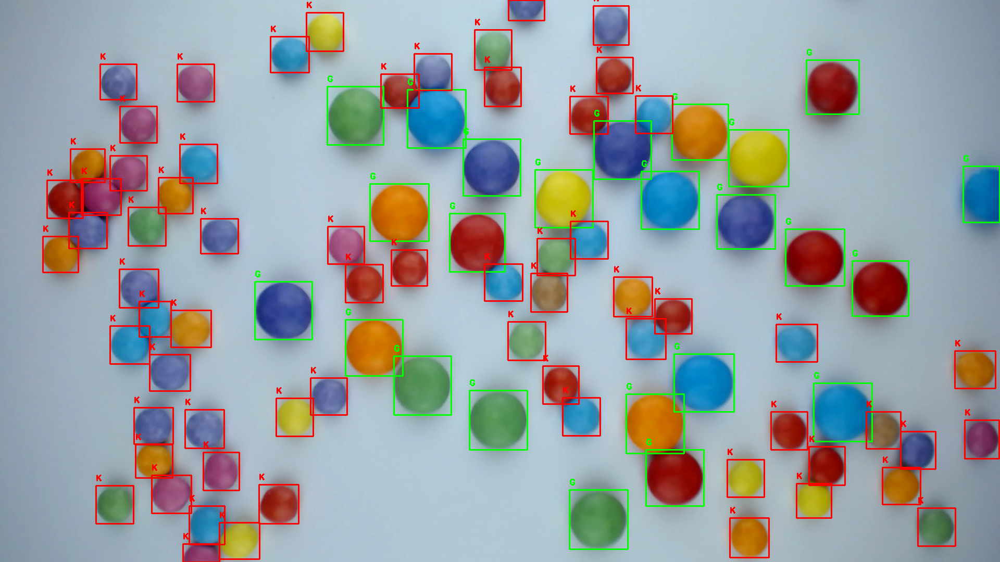

Anzahl der großen Smarties: 24
Anzahl der kleinen Smarties: 66


In [23]:
image_path = r'C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties0.png'


model = YOLO(model_path)
results = model(image_path)
image = cv2.imread(image_path)

def count_smarties_by_area(results, size_threshold=10000):
   
    # Anzahl der kleinen und großen Smarties
    große_smarties_zahl = 0  
    kleine_smarties_zahl = 0  

    for result in results:
        boxes = result.boxes.cpu().numpy().xyxy
        for box in boxes:
             # Bounding Box Koordinaten
            x1, y1, x2, y2 = box[:4] 
             # Flächenberechnung
            area = (x2 - x1) * (y2 - y1) 
            if area >= size_threshold or ((y2 - y1)) >= 100:
                cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)  # Grün für große Smarties
                cv2.putText(image, 'G', (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                große_smarties_zahl += 1
            else:
                cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 255), 2)  # Rot für kleine Smarties
                cv2.putText(image, 'K', (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

                kleine_smarties_zahl += 1

    return große_smarties_zahl, kleine_smarties_zahl

große_smarties_zahl, kleine_smarties_zahl = count_smarties_by_area(results)

output_image_path = 'size_difference.png'
cv2.imwrite(output_image_path, image)

# Anzeigen des Bildes
display(Image(filename=output_image_path))

# Ausgabe
print(f"Anzahl der großen Smarties: {große_smarties_zahl}")
print(f"Anzahl der kleinen Smarties: {kleine_smarties_zahl}")

# Aufgabe 3

In der Aufgabe 3 soll die Anzahl an unterschiedlichen Smarties auf den Bildern gezählt werden, die weggenommen wurden. Dafür wird eine liste_ergebnisse erstellt, um die Anzahl der in verschiedenen Bildern gefundenen Smarties zu speichern. Weiterhin werden alle PNG-Dateien im angegebenen Ordner durchlaufen, das YOLO-Netz wird auf jedes Bild angewendet, und die Anzahl der erkannten Smarties wird der Liste hinzugefügt. Schließlich werden die Gesamtergebnisse und die Differenzen in der Anzahl der erkannten Smarties zwischen aufeinanderfolgenden Bildern ausgegeben.

In [24]:
liste_ergebnisse = []

image_files = sorted([filename for filename in os.listdir(input_folder_path) if filename.endswith(".png")])

for filename in image_files:
    if filename.endswith(".png"):
        image_path = os.path.join(input_folder_path, filename)
        results = model(image_path)

        # Iterieren durch die Ergebnisse und extrahieren die gefundenen Smarties
    for result in results:
        boxes = result.boxes.cpu().numpy().__len__()
        liste_ergebnisse.append(boxes) 


print(liste_ergebnisse) # Ausgabe

for i in range(len(liste_ergebnisse)-1):
    diff=(liste_ergebnisse[i]-liste_ergebnisse[i+1])
    print('Die Differenz zwischen', image_files[i], 'und' ,image_files[i+1], 'beträgt:', diff) 



image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties0.png: 384x640 90 smarties, 254.7ms
Speed: 3.0ms preprocess, 254.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties1.png: 384x640 87 smarties, 257.5ms
Speed: 2.0ms preprocess, 257.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties2.png: 384x640 81 smarties, 249.4ms
Speed: 1.5ms preprocess, 249.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 C:\Users\benutzer 1\Documents\Master\QM\object-detection-smarties-aktualisiert-td2648s\smarties_img\smarties3.png: 384x640 77 smarties, 273.5ms
Speed: 2.0ms preprocess, 273.5ms inference, 1.0ms postprocess per image at shape (1, 3

# Ergebnis

## 1) Zählt die roten Smarties in den Bildern

Auf den gegenbenen Smarties Bildern konnten folgende Anzahl an roten Smarties ermittelt werden:

    smarties0.png: 17 rote Smarties
    smarties1.png: 16 rote Smarties
    smarties2.png: 15 rote Smarties
    smarties3.png: 13 rote Smarties
    smarties4.png: 14 rote Smarties
    smarties5.png: 14 rote Smarties
    smarties6.png: 14 rote Smarties
    smarties7.png: 14 rote Smarties

## 2) Zählt große und kleine Smarties

Auf den gegenbenen smarties0.png Bild konnten folgende Anzahl an großen und kleinen Smarties ermittelt werden:

    smarties0.png: 24 große Smarties
    smarties0.png: 66 kleine Smarties

## 3) Zählt die jeweils weggenommenen Smarties

Auf den gegenbenen Smarties Bildern konnten folgende Anzahl an entfernten Smarties ermittelt werden:

    smarties0.png zu smarties1.png: 3 Smarties
    smarties1.png zu smarties2.png: 6 Smarties
    smarties2.png zu smarties3.png: 4 Smarties
    smarties3.png zu smarties4.png: 9 Smarties
    smarties4.png zu smarties5.png: 4 Smarties
    smarties5.png zu smarties6.png: 5 Smarties
    smarties6.png zu smarties7.png: 7 Smarties